In [1]:
all_norm_datasets = []

scope_312  SNR: 16.23
scope_313  SNR: 17.49
scope_314  SNR: 17.10
scope_315  SNR: 9.11
scope_316  SNR: 18.03
scope_317  SNR: 12.00
scope_318  SNR: 16.30
scope_319  SNR: 17.59
scope_320  SNR: 16.44
scope_321  SNR: 20.33
scope_322  SNR: 19.05
scope_323  SNR: 8.13
scope_324  SNR: 16.30
scope_325  SNR: 16.10
scope_326  SNR: 11.46
scope_327  SNR: 18.08
scope_328  SNR: 16.63
scope_329  SNR: 21.02
scope_330  SNR: 9.57
scope_331  SNR: 18.64


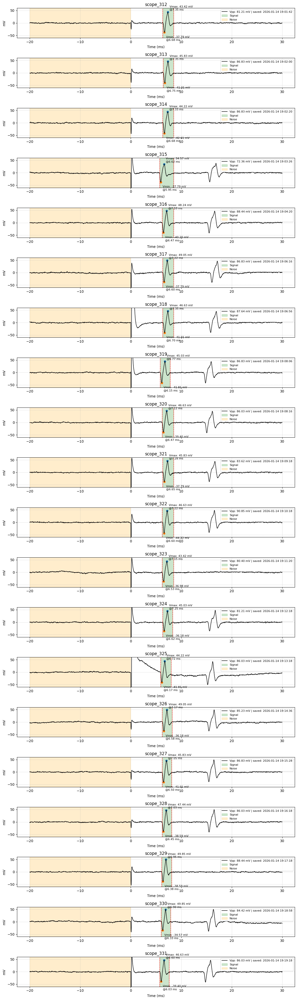

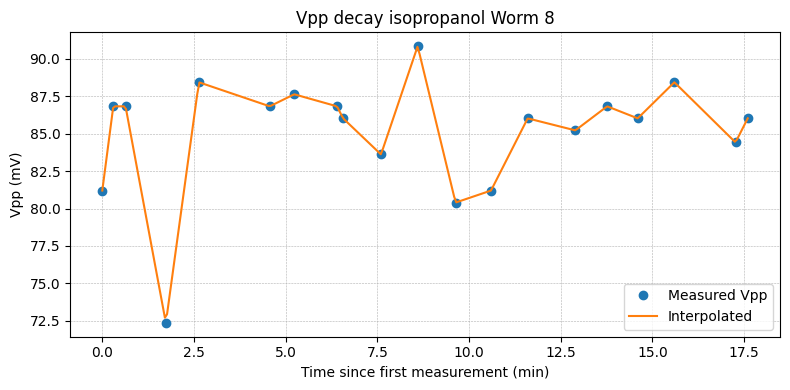

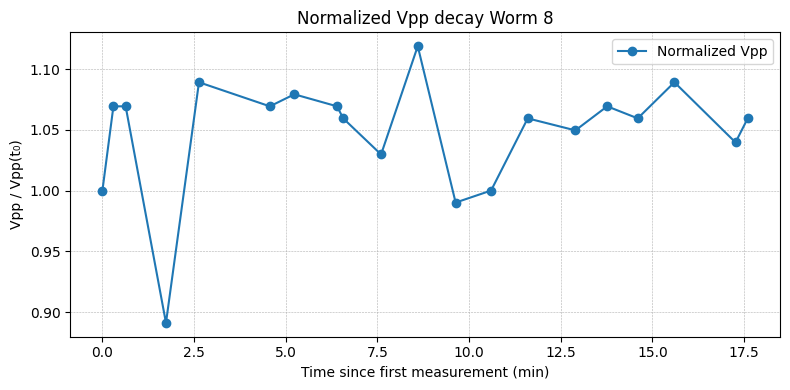


Average SNR (linear): 15.78
Average SNR (dB): 23.96 dB
Average Vpp: 85.11 mV
[81.20602 86.83417 86.83417 72.3618  88.44221 86.83417 87.63819 86.83417
 86.03015 83.61809 90.85428 80.402   81.20603 86.03015 85.22613 86.83417
 86.03015 88.44221 84.42211 86.03015]


In [2]:
#WORM 8
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo
from scipy.interpolate import interp1d

# -------- settings --------
folder = "Worm 8"
scope_start = 312
num_files = 20

# Define time windows for each file as (t_start, t_end) in ms
time_windows = [
    (6.3, 8.5), #12
    (6.4, 8.5), #13
    (6.3, 8.5), #14
    (5.7, 8.5), #15
    (6.2, 8.5), #16
    (6.3, 8.5), #17
    (6.3, 8.5), #18
    (5.8, 7.8), #19
    (6.2, 8.5), #20
    (6.3, 8.5), #21
    (6.2, 8.5), #22
    (6.2, 8.5), #23
    (6.3, 8.3), #24
    (5.9, 8),   #25
    (6.2, 8.2), #26
    (6.2, 8.1), #27
    (6.2, 8.1), #28
    (6.1, 8.1), #29
    (6, 7.9),   #30
    (5.7, 7.6), #31
]

# Storage
vpp_values = []
timestamps = []
snr_values = []

# -------- First figure: individual traces (UNCHANGED) --------
fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")

    t_start, t_end = time_windows[i]

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)

        # Drop unit row and convert to numeric
        df = df.drop(index=0).reset_index(drop=True)
        for col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

        # Convert units
        t_ms = df["x-axis"].values * 1e3
        ch2_mV = df["2"].values * 1e3

        # File timestamp
        mtime = os.path.getmtime(file_path)
        ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
        timestamps.append(ts)
        timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")
    else:
        print(f"Warning: {file_path} not found.")
        t_ms = np.linspace(0, 10, 500)
        ch2_mV = np.full_like(t_ms, np.nan)
        timestamps.append(None)
        timestamp_str = "N/A"

    # Masks
    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    # -------- Vpp calculation --------
    if np.any(signal_mask) and np.any(~np.isnan(ch2_mV[signal_mask])):
        signal_vals = ch2_mV[signal_mask]
        vmax = np.nanmax(signal_vals)
        vmin = np.nanmin(signal_vals)
        vpp = vmax - vmin

        seg_indices = np.where(signal_mask)[0]
        try:
            idx_vmax = seg_indices[np.nanargmax(ch2_mV[seg_indices])]
            idx_vmin = seg_indices[np.nanargmin(ch2_mV[seg_indices])]
            vmax_t = t_ms[idx_vmax]
            vmin_t = t_ms[idx_vmin]
        except Exception:
            vmax_t = None
            vmin_t = None
    else:
        vpp = np.nan
        vmax = np.nan
        vmin = np.nan
        vmax_t = None
        vmin_t = None

    vpp_values.append(vpp)

    # -------- SNR calculation (VRMS-based) --------
    if np.any(signal_mask) and np.any(noise_mask):
        signal_vrms = np.sqrt(np.nanmean(ch2_mV[signal_mask] ** 2))
        noise_vrms = np.sqrt(np.nanmean(ch2_mV[noise_mask] ** 2))
        snr = signal_vrms / noise_vrms if noise_vrms > 0 else np.nan
    else:
        snr = np.nan

    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    # -------- Plot trace --------
    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    if np.any(signal_mask):
        ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    if np.any(noise_mask):
        ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    if not np.isnan(vpp):
        if vmax_t is not None:
            ax.scatter(vmax_t, vmax, s=30)
            ax.annotate(f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
                        (vmax_t, vmax), xytext=(5, 5),
                        textcoords="offset points", fontsize=8)
        if vmin_t is not None:
            ax.scatter(vmin_t, vmin, s=30)
            ax.annotate(f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
                        (vmin_t, vmin), xytext=(5, -24),
                        textcoords="offset points", fontsize=8)

    ax.set_ylim(-60, 60)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

# -------- Second figure: Vpp decay over time --------
valid = [(ts, vpp) for ts, vpp in zip(timestamps, vpp_values) if ts is not None and not np.isnan(vpp)]

if valid:
    valid.sort(key=lambda x: x[0])
    t0 = valid[0][0]

    time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in valid])
    vpp_arr = np.array([vpp for _, vpp in valid])

    interp_fn = interp1d(time_min, vpp_arr, kind="linear", fill_value="extrapolate")
    t_dense = np.linspace(time_min.min(), time_min.max(), 300)
    vpp_interp = interp_fn(t_dense)

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_arr, "o", label="Measured Vpp")
    plt.plot(t_dense, vpp_interp, "-", label="Interpolated")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp (mV)")
    plt.title(f"Vpp decay isopropanol {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()



# -------- Normalized Vpp decay (fraction of first measurement) --------
if valid:
    vpp_norm = vpp_arr / vpp_arr[0]  # normalize to first measurement

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_norm, "o-", label="Normalized Vpp")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp / Vpp(t₀)")
    plt.title(f"Normalized Vpp decay {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -------- Average SNR --------
snr_array = np.array(snr_values)
snr_valid = snr_array[~np.isnan(snr_array)]

if snr_valid.size > 0:
    snr_mean = np.mean(snr_valid)
    snr_mean_db = 20 * np.log10(snr_mean)
    print(f"\nAverage SNR (linear): {snr_mean:.2f}")
    print(f"Average SNR (dB): {snr_mean_db:.2f} dB")
else:
    print("\nNo valid SNR values.")

# -------- Average Vpp --------
vpp_array = np.array(vpp_values)
vpp_valid = vpp_array[~np.isnan(vpp_array)]

if vpp_valid.size > 0:
    vpp_mean = np.mean(vpp_valid)
    print(f"Average Vpp: {vpp_mean:.2f} mV")
else:
    print("No valid Vpp values.")

# ---- store normalized decay for later comparison ----
if valid:
    all_norm_datasets.append({
        "time_min": time_min,
        "vpp_norm": vpp_arr / vpp_arr[0],
        "label": folder
    })

print(vpp_array)

scope_332  SNR: 14.83
scope_333  SNR: 16.13
scope_334  SNR: 13.65
scope_335  SNR: 12.47
scope_336  SNR: 14.82
scope_337  SNR: 14.41
scope_338  SNR: 14.72
scope_339  SNR: 14.70
scope_340  SNR: 17.57
scope_341  SNR: 13.92
scope_342  SNR: 13.87
scope_343  SNR: 13.59
scope_344  SNR: 12.47


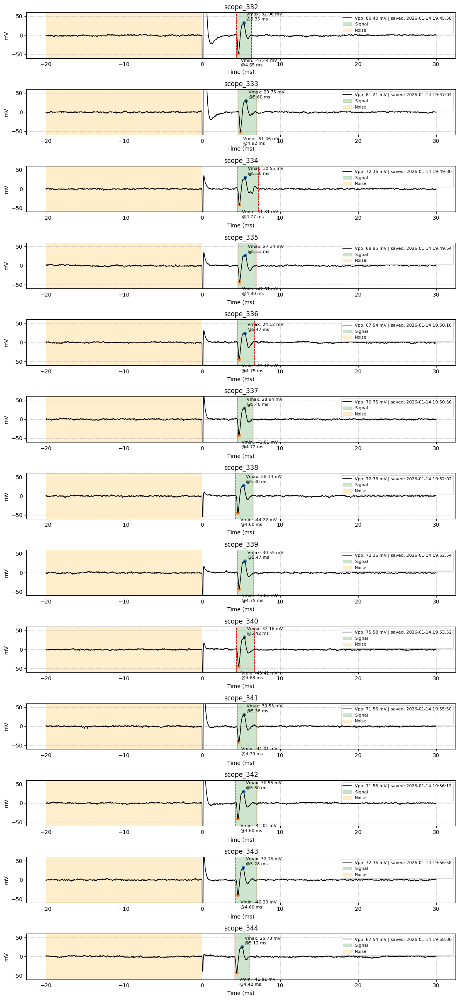

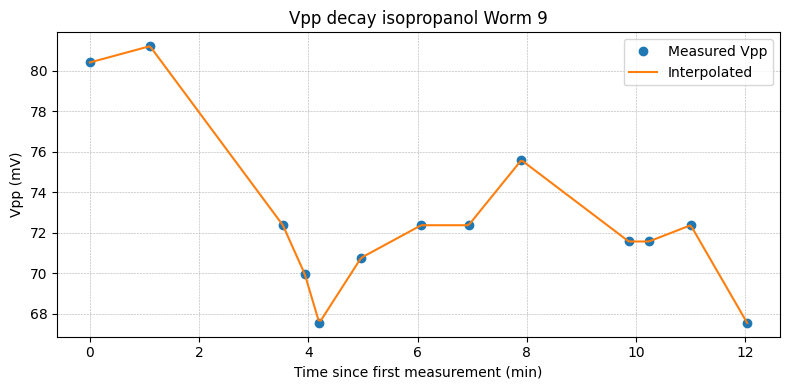

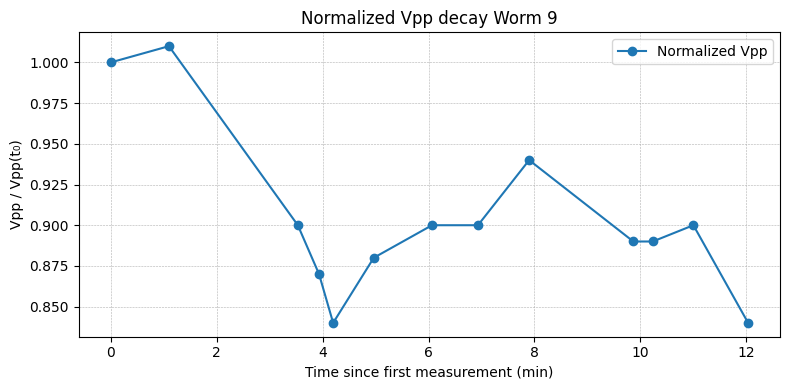


Average SNR (linear): 14.40
Average SNR (dB): 23.16 dB
Average Vpp: 72.73 mV
[80.40201 81.20603 72.3618  69.94974 67.53768 70.75376 72.36181 72.3618
 75.57788 71.55778 71.55778 72.3618  67.53768]


In [3]:
#WORM 9
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo
from scipy.interpolate import interp1d

# -------- settings --------
folder = "Worm 9"
scope_start = 332
num_files = 13

# Define time windows for each file as (t_start, t_end)
time_windows = [
    (4.4, 6.3), #32
    (4.6, 7),   #33
    (4.5, 7.2), #34
    (4.6, 6.9), #35
    (4.5, 6.7), #36
    (4.5, 6.5), #37
    (4.3, 6.5),   #38
    (4.5, 6.6),   #39
    (4.4, 6.7),   #40
    (4.5, 7),   #41
    (4.3, 7),   #42
    (4.3, 7),   #43
    (4.2, 6),   #44

]

# Storage
vpp_values = []
timestamps = []
snr_values = []

# -------- First figure: individual traces (UNCHANGED) --------
fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")

    t_start, t_end = time_windows[i]

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)

        # Drop unit row and convert to numeric
        df = df.drop(index=0).reset_index(drop=True)
        for col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

        # Convert units
        t_ms = df["x-axis"].values * 1e3
        ch2_mV = df["2"].values * 1e3

        # File timestamp
        mtime = os.path.getmtime(file_path)
        ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
        timestamps.append(ts)
        timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")
    else:
        print(f"Warning: {file_path} not found.")
        t_ms = np.linspace(0, 10, 500)
        ch2_mV = np.full_like(t_ms, np.nan)
        timestamps.append(None)
        timestamp_str = "N/A"

    # Masks
    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    # -------- Vpp calculation --------
    if np.any(signal_mask) and np.any(~np.isnan(ch2_mV[signal_mask])):
        signal_vals = ch2_mV[signal_mask]
        vmax = np.nanmax(signal_vals)
        vmin = np.nanmin(signal_vals)
        vpp = vmax - vmin

        seg_indices = np.where(signal_mask)[0]
        try:
            idx_vmax = seg_indices[np.nanargmax(ch2_mV[seg_indices])]
            idx_vmin = seg_indices[np.nanargmin(ch2_mV[seg_indices])]
            vmax_t = t_ms[idx_vmax]
            vmin_t = t_ms[idx_vmin]
        except Exception:
            vmax_t = None
            vmin_t = None
    else:
        vpp = np.nan
        vmax = np.nan
        vmin = np.nan
        vmax_t = None
        vmin_t = None

    vpp_values.append(vpp)

    # -------- SNR calculation (VRMS-based) --------
    if np.any(signal_mask) and np.any(noise_mask):
        signal_vrms = np.sqrt(np.nanmean(ch2_mV[signal_mask] ** 2))
        noise_vrms = np.sqrt(np.nanmean(ch2_mV[noise_mask] ** 2))
        snr = signal_vrms / noise_vrms if noise_vrms > 0 else np.nan
    else:
        snr = np.nan

    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    # -------- Plot trace --------
    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    if np.any(signal_mask):
        ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    if np.any(noise_mask):
        ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    if not np.isnan(vpp):
        if vmax_t is not None:
            ax.scatter(vmax_t, vmax, s=30)
            ax.annotate(f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
                        (vmax_t, vmax), xytext=(5, 5),
                        textcoords="offset points", fontsize=8)
        if vmin_t is not None:
            ax.scatter(vmin_t, vmin, s=30)
            ax.annotate(f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
                        (vmin_t, vmin), xytext=(5, -24),
                        textcoords="offset points", fontsize=8)

    ax.set_ylim(-60, 60)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

# -------- Second figure: Vpp decay over time --------
valid = [(ts, vpp) for ts, vpp in zip(timestamps, vpp_values) if ts is not None and not np.isnan(vpp)]

if valid:
    valid.sort(key=lambda x: x[0])
    t0 = valid[0][0]

    time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in valid])
    vpp_arr = np.array([vpp for _, vpp in valid])

    interp_fn = interp1d(time_min, vpp_arr, kind="linear", fill_value="extrapolate")
    t_dense = np.linspace(time_min.min(), time_min.max(), 300)
    vpp_interp = interp_fn(t_dense)

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_arr, "o", label="Measured Vpp")
    plt.plot(t_dense, vpp_interp, "-", label="Interpolated")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp (mV)")
    plt.title(f"Vpp decay isopropanol {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()



# -------- Normalized Vpp decay (fraction of first measurement) --------
if valid:
    vpp_norm = vpp_arr / vpp_arr[0]  # normalize to first measurement

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_norm, "o-", label="Normalized Vpp")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp / Vpp(t₀)")
    plt.title(f"Normalized Vpp decay {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -------- Average SNR --------
snr_array = np.array(snr_values)
snr_valid = snr_array[~np.isnan(snr_array)]

if snr_valid.size > 0:
    snr_mean = np.mean(snr_valid)
    snr_mean_db = 20 * np.log10(snr_mean)
    print(f"\nAverage SNR (linear): {snr_mean:.2f}")
    print(f"Average SNR (dB): {snr_mean_db:.2f} dB")
else:
    print("\nNo valid SNR values.")

# -------- Average Vpp --------
vpp_array = np.array(vpp_values)
vpp_valid = vpp_array[~np.isnan(vpp_array)]

if vpp_valid.size > 0:
    vpp_mean = np.mean(vpp_valid)
    print(f"Average Vpp: {vpp_mean:.2f} mV")
else:
    print("No valid Vpp values.")

# ---- store normalized decay for later comparison ----
if valid:
    all_norm_datasets.append({
        "time_min": time_min,
        "vpp_norm": vpp_arr / vpp_arr[0],
        "label": folder
    })

print(vpp_array)

scope_345  SNR: 17.01
scope_346  SNR: 15.21
scope_347  SNR: 16.89
scope_348  SNR: 11.90
scope_349  SNR: 16.74
scope_350  SNR: 13.65
scope_351  SNR: 13.39
scope_352  SNR: 15.87
scope_353  SNR: 16.39
scope_354  SNR: 8.53
scope_355  SNR: 12.54
scope_356  SNR: 14.72
scope_357  SNR: 15.97
scope_358  SNR: 15.13
scope_359  SNR: 15.12
scope_360  SNR: 14.06
scope_361  SNR: 12.33
scope_362  SNR: 13.73
scope_363  SNR: 13.18
scope_364  SNR: 14.92
scope_365  SNR: 6.19
scope_366  SNR: 11.74
scope_367  SNR: 14.51
scope_368  SNR: 13.78
scope_369  SNR: 13.17
scope_370  SNR: 7.51
scope_371  SNR: 12.95
scope_372  SNR: 12.17
scope_373  SNR: 13.77
scope_374  SNR: 13.63
scope_375  SNR: 14.33
scope_376  SNR: 11.95
scope_377  SNR: 12.79
scope_378  SNR: 12.86
scope_379  SNR: 8.29
scope_380  SNR: 11.51
scope_381  SNR: 12.01
scope_382  SNR: 10.60
scope_383  SNR: 12.16
scope_384  SNR: 13.11
scope_385  SNR: 11.57
scope_386  SNR: 12.45
scope_387  SNR: 12.61
scope_388  SNR: 11.33
scope_389  SNR: 13.14
scope_390  SNR

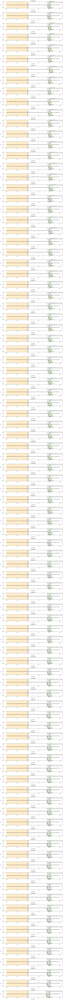

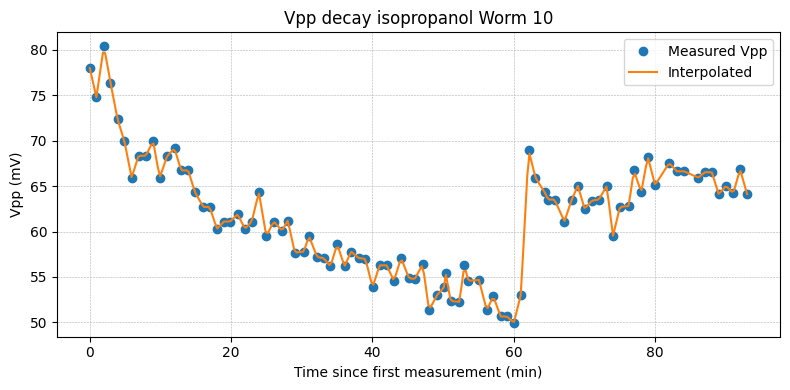

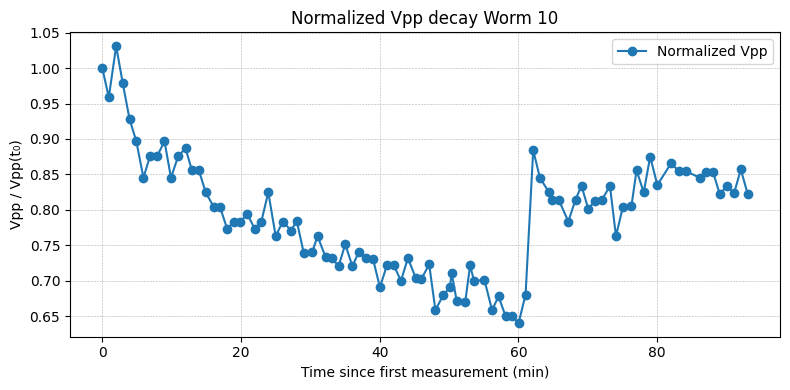


Average SNR (linear): 12.73
Average SNR (dB): 22.10 dB
Average Vpp: 61.67 mV
[77.98995 74.77386 80.40201 76.38191 72.3618  69.94974 65.92964 68.3417
 68.3417  69.94974 65.92964 68.3417  69.14572 66.73366 66.73366 64.3216
 62.71356 62.71356 60.3015  61.10552 61.10552 61.90954 60.3015  61.10552
 64.3216  59.49748 61.10552 60.1005  61.20603 57.68844 57.78894 59.49749
 57.18593 57.08543 56.1809  58.59296 56.1809  57.78894 57.08542 56.98493
 53.86934 56.2814  56.2814  54.57286 57.08543 54.87438 54.77387 56.38191
 51.35678 52.96483 53.86934 55.47738 52.36181 52.2613  56.2814  54.57286
 54.67336 51.35678 52.86432 50.65326 50.65326 49.94975 53.06533 68.94472
 65.92964 64.3216  63.51759 63.51759 61.10552 63.51758 65.02512 62.51256
 63.41708 63.51758 65.02512 59.49748 62.71357 62.81407 66.73366 64.3216
 68.2412  65.12563 67.53769 66.63316 66.63316 65.92964 66.53266 66.53266
 64.1206  65.02512 64.2211  66.83417 64.1206 ]


In [4]:
#WORM 10
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo
from scipy.interpolate import interp1d


# -------- settings --------
folder = "Worm 10"
scope_start = 345
num_files = 93

# Define time windows for each file
time_windows = [
    (18.4, 21.7),   #Scope_345
    (18.4, 21.7),   #Scope_346
    (18.8, 22),     #Scope_347
    (18.4, 21.7),   #Scope_348
    (18.8, 22),     #Scope_349
    (19, 22.2),   #Scope_350
    (19.8, 23.2),     #Scope_351
    (18.9, 22),   #Scope_352
    (18.7, 21.7),   #Scope_353
    (18.8, 22),   #Scope_354
    (18.9, 22.5),   #Scope_355
    (19.2, 22.3),   #Scope_356
    (19.2, 22.3),     #Scope_357
    (19.2, 22.5),   #Scope_358
    (18.9, 21.9),   #Scope_359
    (19.2, 22.4),   #Scope_360
    (19.5, 22.7),   #Scope_361
    (19.6, 23.3),   #Scope_362
    (18.7, 22.3),   #Scope_363
    (18.9, 22.4),   #Scope_364
    (18.9, 22.3),   #Scope_365
    (19.5, 22.6),   #Scope_366
    (19.5, 22.4),   #Scope_367
    (19.4, 22.6),   #Scope_368
    (19.4, 22.6),   #Scope_369
    (19.4, 23),   #Scope_370
    (18.8, 22.2),   #Scope_371
    (19, 22.5),   #Scope_372
    (18.9, 22.5),   #Scope_373
    (18.9, 22.2),   #Scope_374
    (19.2, 22.5),     #Scope_375
    (18.9, 22.3),   #Scope_376
    (18.7, 22.2),   #Scope_377
    (18.6, 22.1),   #Scope_378
    (18.6, 22.3),   #Scope_379
    (18.7, 22.4),   #Scope_380
    (18.8, 22.3),   #Scope_381
    (18.3, 22.2),   #Scope_382
    (18.8, 22.5),   #Scope_383
    (18.7, 22.1),   #Scope_384
    (18.9, 22.3),   #Scope_385
    (18.5, 22.3),   #Scope_386
    (18.4, 22),     #Scope_387
    (18.6, 22.2),   #Scope_388
    (18.6, 22),   #Scope_389
    (18.4, 22),   #Scope_390
    (18.6, 22.4),   #Scope_391
    (18.4, 22.1),   #Scope_392
    (18.2, 21.9),   #Scope_393
    (18.6, 22.3),   #Scope_394
    (18.4, 21.6),   #Scope_395
    (18.2, 22.2),   #Scope_396
    (18.4, 21.7),   #Scope_397
    (18.3, 22.1),   #Scope_398
    (18.4, 21.8),   #Scope_399
    (18.2, 22.1),   #Scope_400
    (18.6, 21.9),   #Scope_401
    (18.1, 22.3),   #Scope_402
    (18.4, 21.6),   #Scope_403
    (18.4, 22),   #Scope_404
    (18, 21.7),   #Scope_405
    (18.1, 21.9),   #Scope_406
    (18.3, 21.8),   #Scope_407
    (17.7, 21.6),   #Scope_408
    (17.7, 21.6),   #Scope_409
    (17.7, 21.6),   #Scope_410
    (17.7, 21.3),   #Scope_411
    (18, 21.3),   #Scope_412
    (18, 21.7),   #Scope_413
    (18, 22.1),   #Scope_414
    (18, 21.8),   #Scope_415
    (17.8, 21.8),   #Scope_416
    (17.9, 21.7),   #Scope_417
    (17.7, 21.7),   #Scope_418
    (17.7, 21.7),   #Scope_419
    (18.1, 22.2),   #Scope_420
    (17.8, 21.4),   #Scope_421
    (17.8, 21.8),   #Scope_422
    (17.8, 21.8),   #Scope_423
    (17.8, 22),   #Scope_424
    (17.8, 21.6),   #Scope_425
    (17.8, 21.7),   #Scope_426
    (17.8, 21.7),   #Scope_427
    (17.8, 21.7),   #Scope_428
    (17.8, 21.9),   #Scope_429
    (17.8, 21.8),   #Scope_430
    (17.8, 21.6),   #Scope_431
    (17.8, 21.6),   #Scope_432
    (17.8, 21.9),   #Scope_433
    (17.8, 21.5),   #Scope_434
    (17.8, 21.6),   #Scope_435
    (17.8, 21),   #Scope_436
    (17.1, 20.7),   #Scope_437
]

# Storage
vpp_values = []
timestamps = []
snr_values = []

# -------- First figure: individual traces (UNCHANGED) --------
fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")

    t_start, t_end = time_windows[i]

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)

        # Drop unit row and convert to numeric
        df = df.drop(index=0).reset_index(drop=True)
        for col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

        # Convert units
        t_ms = df["x-axis"].values * 1e3
        ch2_mV = df["2"].values * 1e3

        # File timestamp
        mtime = os.path.getmtime(file_path)
        ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
        timestamps.append(ts)
        timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")
    else:
        print(f"Warning: {file_path} not found.")
        t_ms = np.linspace(0, 10, 500)
        ch2_mV = np.full_like(t_ms, np.nan)
        timestamps.append(None)
        timestamp_str = "N/A"

    # Masks
    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    # -------- Vpp calculation --------
    if np.any(signal_mask) and np.any(~np.isnan(ch2_mV[signal_mask])):
        signal_vals = ch2_mV[signal_mask]
        vmax = np.nanmax(signal_vals)
        vmin = np.nanmin(signal_vals)
        vpp = vmax - vmin

        seg_indices = np.where(signal_mask)[0]
        try:
            idx_vmax = seg_indices[np.nanargmax(ch2_mV[seg_indices])]
            idx_vmin = seg_indices[np.nanargmin(ch2_mV[seg_indices])]
            vmax_t = t_ms[idx_vmax]
            vmin_t = t_ms[idx_vmin]
        except Exception:
            vmax_t = None
            vmin_t = None
    else:
        vpp = np.nan
        vmax = np.nan
        vmin = np.nan
        vmax_t = None
        vmin_t = None

    vpp_values.append(vpp)

    # -------- SNR calculation (VRMS-based) --------
    if np.any(signal_mask) and np.any(noise_mask):
        signal_vrms = np.sqrt(np.nanmean(ch2_mV[signal_mask] ** 2))
        noise_vrms = np.sqrt(np.nanmean(ch2_mV[noise_mask] ** 2))
        snr = signal_vrms / noise_vrms if noise_vrms > 0 else np.nan
    else:
        snr = np.nan

    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    # -------- Plot trace --------
    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    if np.any(signal_mask):
        ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    if np.any(noise_mask):
        ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    if not np.isnan(vpp):
        if vmax_t is not None:
            ax.scatter(vmax_t, vmax, s=30)
            ax.annotate(f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
                        (vmax_t, vmax), xytext=(5, 5),
                        textcoords="offset points", fontsize=8)
        if vmin_t is not None:
            ax.scatter(vmin_t, vmin, s=30)
            ax.annotate(f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
                        (vmin_t, vmin), xytext=(5, -24),
                        textcoords="offset points", fontsize=8)

    ax.set_ylim(-60, 60)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

# -------- Second figure: Vpp decay over time --------
valid = [(ts, vpp) for ts, vpp in zip(timestamps, vpp_values) if ts is not None and not np.isnan(vpp)]

if valid:
    valid.sort(key=lambda x: x[0])
    t0 = valid[0][0]

    time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in valid])
    vpp_arr = np.array([vpp for _, vpp in valid])

    interp_fn = interp1d(time_min, vpp_arr, kind="linear", fill_value="extrapolate")
    t_dense = np.linspace(time_min.min(), time_min.max(), 300)
    vpp_interp = interp_fn(t_dense)

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_arr, "o", label="Measured Vpp")
    plt.plot(t_dense, vpp_interp, "-", label="Interpolated")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp (mV)")
    plt.title(f"Vpp decay isopropanol {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()



# -------- Normalized Vpp decay (fraction of first measurement) --------
if valid:
    vpp_norm = vpp_arr / vpp_arr[0]  # normalize to first measurement

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_norm, "o-", label="Normalized Vpp")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp / Vpp(t₀)")
    plt.title(f"Normalized Vpp decay {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -------- Average SNR --------
snr_array = np.array(snr_values)
snr_valid = snr_array[~np.isnan(snr_array)]

if snr_valid.size > 0:
    snr_mean = np.mean(snr_valid)
    snr_mean_db = 20 * np.log10(snr_mean)
    print(f"\nAverage SNR (linear): {snr_mean:.2f}")
    print(f"Average SNR (dB): {snr_mean_db:.2f} dB")
else:
    print("\nNo valid SNR values.")

# -------- Average Vpp --------
vpp_array = np.array(vpp_values)
vpp_valid = vpp_array[~np.isnan(vpp_array)]

if vpp_valid.size > 0:
    vpp_mean = np.mean(vpp_valid)
    print(f"Average Vpp: {vpp_mean:.2f} mV")
else:
    print("No valid Vpp values.")

# ---- store normalized decay for later comparison ----
if valid:
    all_norm_datasets.append({
        "time_min": time_min,
        "vpp_norm": vpp_arr / vpp_arr[0],
        "label": folder
    })

print(vpp_array)

scope_440  SNR: 11.07
scope_441  SNR: 11.74
scope_442  SNR: 11.69
scope_443  SNR: 10.90
scope_444  SNR: 11.26
scope_445  SNR: 11.50
scope_446  SNR: 11.60
scope_447  SNR: 11.74
scope_448  SNR: 10.53
scope_449  SNR: 11.02
scope_450  SNR: 10.50
scope_451  SNR: 10.49
scope_452  SNR: 10.86
scope_453  SNR: 12.34
scope_454  SNR: 11.63
scope_455  SNR: 10.61
scope_456  SNR: 12.48
scope_457  SNR: 10.96
scope_458  SNR: 12.28
scope_459  SNR: 12.19
scope_460  SNR: 12.37
scope_461  SNR: 12.35
scope_462  SNR: 11.27
scope_463  SNR: 12.40
scope_464  SNR: 13.68
scope_465  SNR: 12.70
scope_466  SNR: 12.13
scope_467  SNR: 12.96
scope_468  SNR: 11.15
scope_469  SNR: 12.06
scope_470  SNR: 12.36
scope_471  SNR: 10.07
scope_472  SNR: 11.23
scope_473  SNR: 12.56
scope_474  SNR: 11.89
scope_475  SNR: 12.22
scope_476  SNR: 13.23
scope_477  SNR: 14.67
scope_478  SNR: 11.77
scope_479  SNR: 9.91
scope_480  SNR: 13.15
scope_481  SNR: 10.76
scope_482  SNR: 12.89
scope_483  SNR: 12.51
scope_484  SNR: 13.74
scope_485  

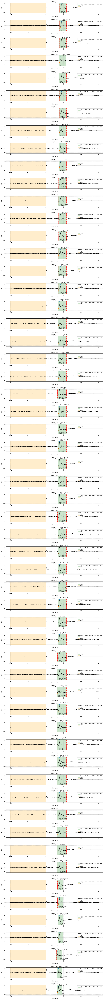

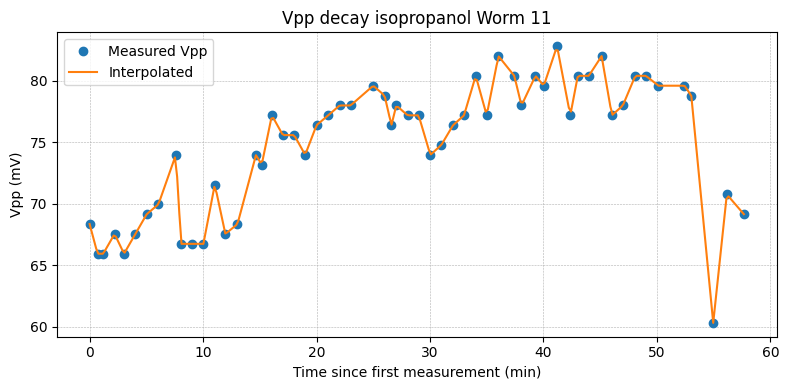

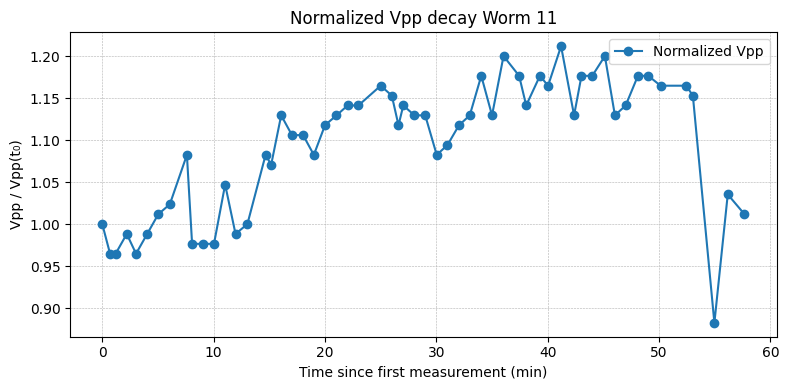


Average SNR (linear): 12.32
Average SNR (dB): 21.81 dB
Average Vpp: 74.83 mV
[68.34171 65.92965 65.92965 67.53769 65.92965 67.53769 69.14573 69.94975
 73.96985 66.73367 66.73367 66.73367 71.55779 67.53769 68.34171 73.96985
 73.16583 77.18593 75.57789 75.57789 73.96985 76.38191 77.18593 77.98995
 77.98995 79.59799 78.79397 76.38191 77.98995 77.18593 77.18593 73.96985
 74.77387 76.38191 77.18593 80.40201 77.18593 82.01005 80.40201 77.98995
 80.40201 79.59799 82.81407 77.18593 80.40201 80.40201 82.01005 77.18593
 77.98995 80.40201 80.40201 79.59799 79.59799 78.79397 60.3015  70.75377
 69.14573]


In [5]:
#WORM 11
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo
from scipy.interpolate import interp1d


# -------- settings --------
folder = "Worm 11"
scope_start = 440
num_files = 57

# Define time windows for each file
time_windows = [
    (7.7, 11.7),   # Scope_440
    (7.7, 11.7),   # Scope_441
    (7.7, 11.7),   # Scope_442
    (7.4, 11.4),   # Scope_443
    (7.5, 11.7),   # Scope_444
    (7.7, 11.7),   # Scope_445
    (7.7, 11.7),   # Scope_446
    (7.5, 11.7),   # Scope_447
    (7.4, 11.7),   # Scope_448
    (7.3, 11.7),   # Scope_449
    (7.2, 11.7),   # Scope_450
    (7.1, 11.7),   # Scope_451
    (7.2, 11.7),   # Scope_452
    (7.2, 11.7),   # Scope_453
    (7.1, 11.7),   # Scope_454
    (7.1, 11.7),   # Scope_455
    (7.1, 11.7),   # Scope_456
    (6.9, 11.7),   # Scope_457
    (6.9, 11.7),   # Scope_458
    (6.9, 11.7),   # Scope_459
    (6.9, 11.7),   # Scope_460
    (6.9, 11.7),   # Scope_461
    (6.6, 11.7),   # Scope_462
    (6.8, 11.7),   # Scope_463
    (7, 11.7),   # Scope_464
    (6.8, 11.7),   # Scope_465
    (6.8, 11.7),   # Scope_466
    (6.8, 11.7),   # Scope_467
    (6.8, 11.7),   # Scope_468
    (6.6, 11.7),   # Scope_469
    (6.8, 11.7),   # Scope_470
    (6.8, 11.7),   # Scope_471
    (6.7, 11.7),   # Scope_472
    (6.7, 11.7),   # Scope_473
    (6.7, 11.7),   # Scope_474
    (6.7, 11.7),   # Scope_475
    (6.7, 11.7),   # Scope_476
    (6.6, 11.7),   # Scope_477
    (6.5, 11.7),   # Scope_478
    (6.5, 11.7),   # Scope_479
    (6.5, 11.7),   # Scope_480
    (6.5, 11.7),   # Scope_481
    (6.5, 11.7),   # Scope_482
    (6.5, 11.7),   # Scope_483
    (6.5, 11.7),   # Scope_484
    (6.5, 11.7),   # Scope_485
    (6.5, 11.7),   # Scope_486
    (6.5, 11.7),   # Scope_487
    (6.5, 11.7),   # Scope_488
    (6.5, 11.7),   # Scope_489
    (6.6, 9.6),   # Scope_490
    (6.6, 9.6),   # Scope_491
    (6.7, 9.6),   # Scope_492
    (6.8, 9.6),   # Scope_493
    (6, 9.2),   # Scope_494
    (6.4, 9.2),   # Scope_495
    (6.4, 9.2),   # Scope_496
]

# Storage
vpp_values = []
timestamps = []
snr_values = []

# -------- First figure: individual traces (UNCHANGED) --------
fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")

    t_start, t_end = time_windows[i]

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)

        # Drop unit row and convert to numeric
        df = df.drop(index=0).reset_index(drop=True)
        for col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

        # Convert units
        t_ms = df["x-axis"].values * 1e3
        ch2_mV = df["2"].values * 1e3

        # File timestamp
        mtime = os.path.getmtime(file_path)
        ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
        timestamps.append(ts)
        timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")
    else:
        print(f"Warning: {file_path} not found.")
        t_ms = np.linspace(0, 10, 500)
        ch2_mV = np.full_like(t_ms, np.nan)
        timestamps.append(None)
        timestamp_str = "N/A"

    # Masks
    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    # -------- Vpp calculation --------
    if np.any(signal_mask) and np.any(~np.isnan(ch2_mV[signal_mask])):
        signal_vals = ch2_mV[signal_mask]
        vmax = np.nanmax(signal_vals)
        vmin = np.nanmin(signal_vals)
        vpp = vmax - vmin

        seg_indices = np.where(signal_mask)[0]
        try:
            idx_vmax = seg_indices[np.nanargmax(ch2_mV[seg_indices])]
            idx_vmin = seg_indices[np.nanargmin(ch2_mV[seg_indices])]
            vmax_t = t_ms[idx_vmax]
            vmin_t = t_ms[idx_vmin]
        except Exception:
            vmax_t = None
            vmin_t = None
    else:
        vpp = np.nan
        vmax = np.nan
        vmin = np.nan
        vmax_t = None
        vmin_t = None

    vpp_values.append(vpp)

    # -------- SNR calculation (VRMS-based) --------
    if np.any(signal_mask) and np.any(noise_mask):
        signal_vrms = np.sqrt(np.nanmean(ch2_mV[signal_mask] ** 2))
        noise_vrms = np.sqrt(np.nanmean(ch2_mV[noise_mask] ** 2))
        snr = signal_vrms / noise_vrms if noise_vrms > 0 else np.nan
    else:
        snr = np.nan

    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    # -------- Plot trace --------
    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    if np.any(signal_mask):
        ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    if np.any(noise_mask):
        ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    if not np.isnan(vpp):
        if vmax_t is not None:
            ax.scatter(vmax_t, vmax, s=30)
            ax.annotate(f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
                        (vmax_t, vmax), xytext=(5, 5),
                        textcoords="offset points", fontsize=8)
        if vmin_t is not None:
            ax.scatter(vmin_t, vmin, s=30)
            ax.annotate(f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
                        (vmin_t, vmin), xytext=(5, -24),
                        textcoords="offset points", fontsize=8)

    ax.set_ylim(-60, 60)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

# -------- Second figure: Vpp decay over time --------
valid = [(ts, vpp) for ts, vpp in zip(timestamps, vpp_values) if ts is not None and not np.isnan(vpp)]

if valid:
    valid.sort(key=lambda x: x[0])
    t0 = valid[0][0]

    time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in valid])
    vpp_arr = np.array([vpp for _, vpp in valid])

    interp_fn = interp1d(time_min, vpp_arr, kind="linear", fill_value="extrapolate")
    t_dense = np.linspace(time_min.min(), time_min.max(), 300)
    vpp_interp = interp_fn(t_dense)

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_arr, "o", label="Measured Vpp")
    plt.plot(t_dense, vpp_interp, "-", label="Interpolated")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp (mV)")
    plt.title(f"Vpp decay isopropanol {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()



# -------- Normalized Vpp decay (fraction of first measurement) --------
if valid:
    vpp_norm = vpp_arr / vpp_arr[0]  # normalize to first measurement

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_norm, "o-", label="Normalized Vpp")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp / Vpp(t₀)")
    plt.title(f"Normalized Vpp decay {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -------- Average SNR --------
snr_array = np.array(snr_values)
snr_valid = snr_array[~np.isnan(snr_array)]

if snr_valid.size > 0:
    snr_mean = np.mean(snr_valid)
    snr_mean_db = 20 * np.log10(snr_mean)
    print(f"\nAverage SNR (linear): {snr_mean:.2f}")
    print(f"Average SNR (dB): {snr_mean_db:.2f} dB")
else:
    print("\nNo valid SNR values.")

# -------- Average Vpp --------
vpp_array = np.array(vpp_values)
vpp_valid = vpp_array[~np.isnan(vpp_array)]

if vpp_valid.size > 0:
    vpp_mean = np.mean(vpp_valid)
    print(f"Average Vpp: {vpp_mean:.2f} mV")
else:
    print("No valid Vpp values.")

# ---- store normalized decay for later comparison ----
if valid:
    all_norm_datasets.append({
        "time_min": time_min,
        "vpp_norm": vpp_arr / vpp_arr[0],
        "label": folder
    })

print(vpp_array)

scope_497  SNR: 22.77
scope_498  SNR: 18.31
scope_499  SNR: 19.47
scope_500  SNR: 25.06
scope_501  SNR: 24.58
scope_502  SNR: 18.78
scope_503  SNR: 22.36
scope_504  SNR: 22.16
scope_505  SNR: 23.10
scope_506  SNR: 23.12
scope_507  SNR: 19.60
scope_508  SNR: 21.21
scope_509  SNR: 22.95
scope_510  SNR: 22.43
scope_511  SNR: 22.68
scope_512  SNR: 22.88
scope_513  SNR: 19.74
scope_514  SNR: 24.49
scope_515  SNR: 22.97
scope_516  SNR: 21.94
scope_517  SNR: 24.78
scope_518  SNR: 22.39
scope_519  SNR: 22.89
scope_520  SNR: 22.25
scope_521  SNR: 19.29
scope_522  SNR: 19.51
scope_523  SNR: 19.28
scope_524  SNR: 23.44
scope_525  SNR: 20.28
scope_526  SNR: 22.06
scope_527  SNR: 22.21
scope_528  SNR: 21.39
scope_529  SNR: 17.37
scope_530  SNR: 13.56
scope_531  SNR: 21.91
scope_532  SNR: 19.69
scope_533  SNR: 8.45


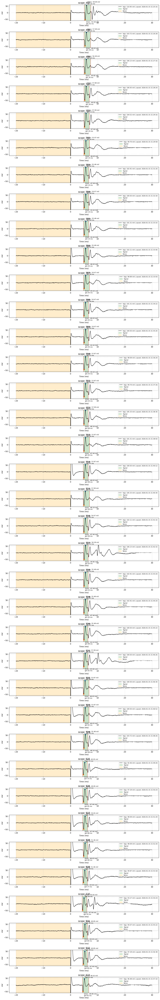

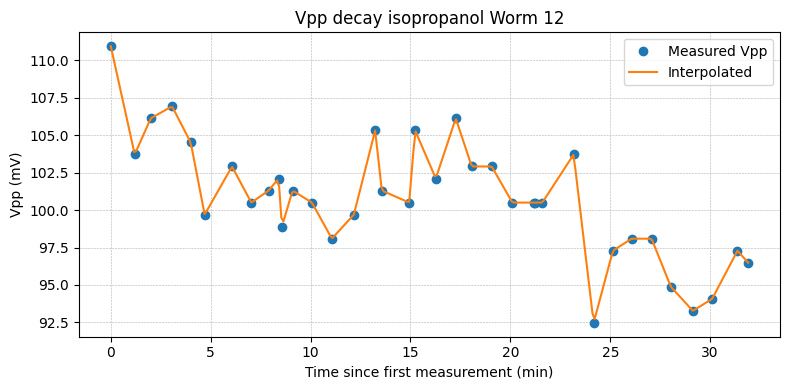

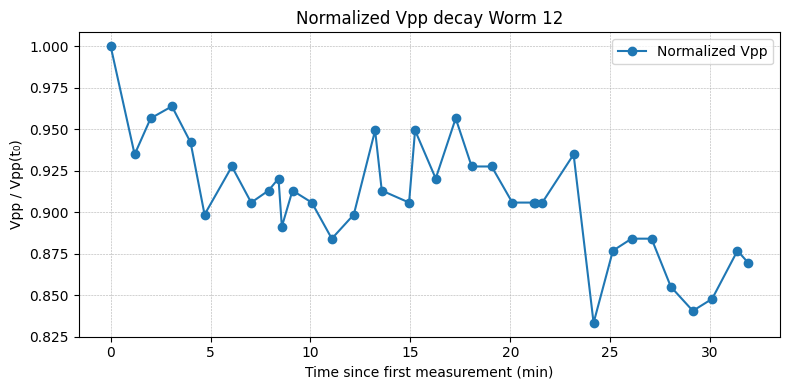


Average SNR (linear): 21.12
Average SNR (dB): 26.49 dB
Average Vpp: 100.85 mV
[110.95478 103.7186  106.13066 106.93468 104.52262  99.6985  102.91458
 100.50252 101.30654 102.11056  98.89448 101.30654 100.50252  98.09046
  99.6985  105.32664 101.30654 100.50252 105.32664 102.11056 106.13066
 102.91458 102.91458 100.50252 100.50251 100.50252 100.50252 103.7186
  92.46231  97.28644  98.09046  98.09046  94.87437  93.26634  94.07036
  97.28644  96.48242]


In [6]:
#WORM 12
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
from zoneinfo import ZoneInfo
from scipy.interpolate import interp1d


# -------- settings --------
folder = "Worm 12"
scope_start = 497
num_files = 37

# Define time windows for each file
time_windows = [
    (5.1, 7.5),   # Scope_497
    (5, 7.4),   # Scope_498
    (5, 7.4),   # Scope_499
    (5, 6.9),   # Scope_500
    (5, 6.9),   # Scope_501
    (4.9, 7),   # Scope_502
    (4.8, 6.7),   # Scope_503
    (4.8, 6.7),   # Scope_504
    (4.8, 6.7),   # Scope_505
    (4.8, 6.6),   # Scope_506
    (4.8, 7),   # Scope_507
    (4.8, 6.6),   # Scope_508
    (4.8, 6.6),   # Scope_509
    (4.8, 6.6),   # Scope_510
    (4.8, 6.5),   # Scope_511
    (4.8, 6.5),   # Scope_512
    (4.8, 7),   # Scope_513
    (4.7, 6.5),   # Scope_514
    (4.7, 7),   # Scope_515
    (4.7, 6.4),   # Scope_516
    (4.8, 6.5),   # Scope_517
    (4.8, 6.5),   # Scope_518
    (4.8, 6.4),   # Scope_519
    (4.8, 6.4),   # Scope_520
    (4.7, 6.4),   # Scope_521
    (4.7, 6.8),   # Scope_522
    (4.7, 6.8),   # Scope_523
    (4.7, 6.4),   # Scope_524
    (4.5, 6.2),   # Scope_525
    (4.5, 6.2),   # Scope_526
    (4.5, 6.3),   # Scope_527
    (4.7, 6.3),   # Scope_528
    (4.5, 6.2),   # Scope_529
    (4.3, 6),   # Scope_530
    (4.5, 6.2),   # Scope_531
    (4.5, 6.2),   # Scope_532
    (4.4, 6.7),   # Scope_533
]


# Storage
vpp_values = []
timestamps = []
snr_values = []

# -------- First figure: individual traces (UNCHANGED) --------
fig1, axes = plt.subplots(num_files, 1, figsize=(12, num_files * 2), sharex=False)

for i in range(num_files):
    scope = scope_start + i
    ax = axes[i]
    file_path = os.path.join(folder, f"scope_{scope}.csv")

    t_start, t_end = time_windows[i]

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)

        # Drop unit row and convert to numeric
        df = df.drop(index=0).reset_index(drop=True)
        for col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")

        # Convert units
        t_ms = df["x-axis"].values * 1e3
        ch2_mV = df["2"].values * 1e3

        # File timestamp
        mtime = os.path.getmtime(file_path)
        ts = datetime.fromtimestamp(mtime, tz=ZoneInfo("Europe/Amsterdam"))
        timestamps.append(ts)
        timestamp_str = ts.strftime("%Y-%m-%d %H:%M:%S")
    else:
        print(f"Warning: {file_path} not found.")
        t_ms = np.linspace(0, 10, 500)
        ch2_mV = np.full_like(t_ms, np.nan)
        timestamps.append(None)
        timestamp_str = "N/A"

    # Masks
    signal_mask = (t_ms >= t_start) & (t_ms <= t_end)
    noise_mask = (t_ms >= -20) & (t_ms <= -0.01)

    # -------- Vpp calculation --------
    if np.any(signal_mask) and np.any(~np.isnan(ch2_mV[signal_mask])):
        signal_vals = ch2_mV[signal_mask]
        vmax = np.nanmax(signal_vals)
        vmin = np.nanmin(signal_vals)
        vpp = vmax - vmin

        seg_indices = np.where(signal_mask)[0]
        try:
            idx_vmax = seg_indices[np.nanargmax(ch2_mV[seg_indices])]
            idx_vmin = seg_indices[np.nanargmin(ch2_mV[seg_indices])]
            vmax_t = t_ms[idx_vmax]
            vmin_t = t_ms[idx_vmin]
        except Exception:
            vmax_t = None
            vmin_t = None
    else:
        vpp = np.nan
        vmax = np.nan
        vmin = np.nan
        vmax_t = None
        vmin_t = None

    vpp_values.append(vpp)

    # -------- SNR calculation (VRMS-based) --------
    if np.any(signal_mask) and np.any(noise_mask):
        signal_vrms = np.sqrt(np.nanmean(ch2_mV[signal_mask] ** 2))
        noise_vrms = np.sqrt(np.nanmean(ch2_mV[noise_mask] ** 2))
        snr = signal_vrms / noise_vrms if noise_vrms > 0 else np.nan
    else:
        snr = np.nan

    snr_values.append(snr)

    print(f"scope_{scope}  SNR: {snr:.2f}")

    # -------- Plot trace --------
    ax.plot(
        t_ms,
        ch2_mV,
        linewidth=1.2,
        color="black",
        label=f"Vpp: {vpp:.2f} mV | saved: {timestamp_str}",
    )

    ax.axvline(t_start, color="red", linestyle="--", linewidth=1)
    ax.axvline(t_end, color="red", linestyle="--", linewidth=1)

    if np.any(signal_mask):
        ax.fill_between(t_ms, -60, 60, where=signal_mask, color="green", alpha=0.2, label="Signal")
    if np.any(noise_mask):
        ax.fill_between(t_ms, -60, 60, where=noise_mask, color="orange", alpha=0.2, label="Noise")

    if not np.isnan(vpp):
        if vmax_t is not None:
            ax.scatter(vmax_t, vmax, s=30)
            ax.annotate(f"Vmax: {vmax:.2f} mV\n@{vmax_t:.2f} ms",
                        (vmax_t, vmax), xytext=(5, 5),
                        textcoords="offset points", fontsize=8)
        if vmin_t is not None:
            ax.scatter(vmin_t, vmin, s=30)
            ax.annotate(f"Vmin: {vmin:.2f} mV\n@{vmin_t:.2f} ms",
                        (vmin_t, vmin), xytext=(5, -24),
                        textcoords="offset points", fontsize=8)

    ax.set_ylim(-60, 60)
    ax.set_ylabel("mV")
    ax.set_xlabel("Time (ms)")
    ax.set_title(f"scope_{scope}")
    ax.grid(True, which="both", linestyle="--", linewidth=0.4)
    ax.legend(loc="upper right", fontsize=8)

fig1.tight_layout()
plt.show()

# -------- Second figure: Vpp decay over time --------
valid = [(ts, vpp) for ts, vpp in zip(timestamps, vpp_values) if ts is not None and not np.isnan(vpp)]

if valid:
    valid.sort(key=lambda x: x[0])
    t0 = valid[0][0]

    time_min = np.array([(ts - t0).total_seconds() / 60.0 for ts, _ in valid])
    vpp_arr = np.array([vpp for _, vpp in valid])

    interp_fn = interp1d(time_min, vpp_arr, kind="linear", fill_value="extrapolate")
    t_dense = np.linspace(time_min.min(), time_min.max(), 300)
    vpp_interp = interp_fn(t_dense)

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_arr, "o", label="Measured Vpp")
    plt.plot(t_dense, vpp_interp, "-", label="Interpolated")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp (mV)")
    plt.title(f"Vpp decay isopropanol {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()



# -------- Normalized Vpp decay (fraction of first measurement) --------
if valid:
    vpp_norm = vpp_arr / vpp_arr[0]  # normalize to first measurement

    plt.figure(figsize=(8, 4))
    plt.plot(time_min, vpp_norm, "o-", label="Normalized Vpp")
    plt.xlabel("Time since first measurement (min)")
    plt.ylabel("Vpp / Vpp(t₀)")
    plt.title(f"Normalized Vpp decay {folder}")
    plt.grid(True, which="both", linestyle="--", linewidth=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


# -------- Average SNR --------
snr_array = np.array(snr_values)
snr_valid = snr_array[~np.isnan(snr_array)]

if snr_valid.size > 0:
    snr_mean = np.mean(snr_valid)
    snr_mean_db = 20 * np.log10(snr_mean)
    print(f"\nAverage SNR (linear): {snr_mean:.2f}")
    print(f"Average SNR (dB): {snr_mean_db:.2f} dB")
else:
    print("\nNo valid SNR values.")

# -------- Average Vpp --------
vpp_array = np.array(vpp_values)
vpp_valid = vpp_array[~np.isnan(vpp_array)]

if vpp_valid.size > 0:
    vpp_mean = np.mean(vpp_valid)
    print(f"Average Vpp: {vpp_mean:.2f} mV")
else:
    print("No valid Vpp values.")

# ---- store normalized decay for later comparison ----
if valid:
    all_norm_datasets.append({
        "time_min": time_min,
        "vpp_norm": vpp_arr / vpp_arr[0],
        "label": folder
    })

print(vpp_array)

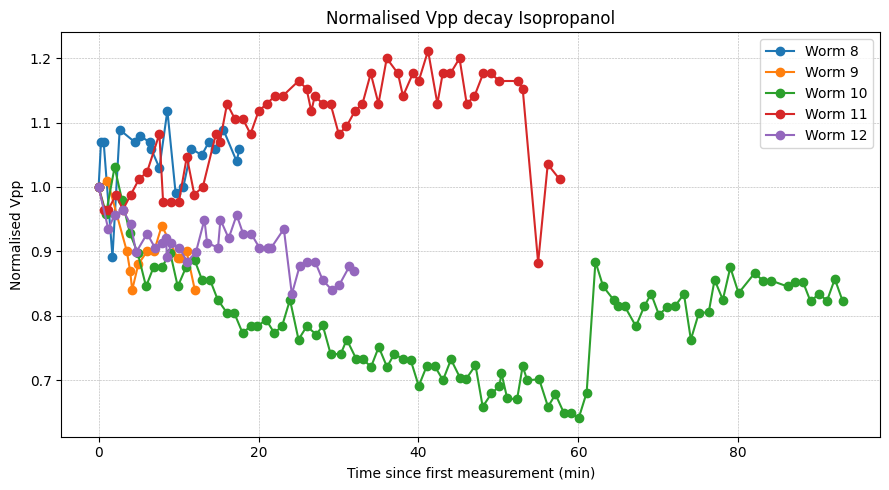

In [7]:
#ALL WORMS
plt.figure(figsize=(9, 5))

for data in all_norm_datasets:
    plt.plot(
        data["time_min"],
        data["vpp_norm"],
        marker="o",
        linestyle="-",
        label=data["label"]
    )

plt.xlabel("Time since first measurement (min)")
plt.ylabel("Normalised Vpp")
plt.title("Normalised Vpp decay Isopropanol")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()


C:\Users\jurre\AppData\Local\Temp\ipykernel_21296\2110350016.py:41: RuntimeWarning: Mean of empty slice
  mean_y = np.nanmean(all_y_interp, axis=0)


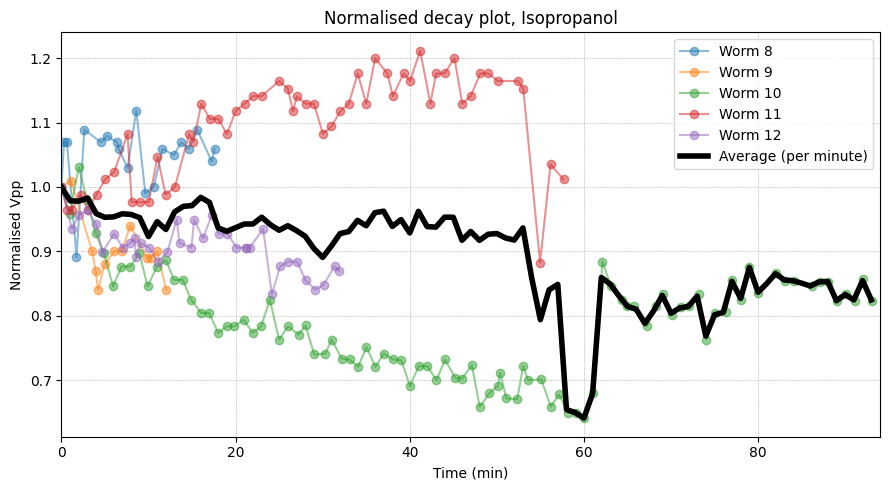

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# ALL EX VIVO
plt.figure(figsize=(9, 5))

# Determine common integer-minute time axis
t_min = int(np.floor(min(data["time_min"].min() for data in all_norm_datasets)))
t_max = int(np.ceil(max(data["time_min"].max() for data in all_norm_datasets)))
all_x = np.arange(t_min, t_max + 1, 1)  # 1-minute steps

all_y_interp = []

for data in all_norm_datasets:
    x = data["time_min"]
    y = data["vpp_norm"]
    
    # Plot individual datasets
    plt.plot(
        x,
        y,
        marker="o",
        linestyle="-",
        alpha=0.5,
        label=data["label"]
    )
    
    # Interpolate to exact minute marks
    y_interp = np.interp(
        all_x,
        x,
        y,
        left=np.nan,
        right=np.nan
    )
    all_y_interp.append(y_interp)

all_y_interp = np.array(all_y_interp)

# Compute per-minute mean, ignoring missing values
mean_y = np.nanmean(all_y_interp, axis=0)

# Plot the average signal
plt.plot(
    all_x,
    mean_y,
    linestyle="-",
    color="black",
    linewidth=4,
    label="Average (per minute)"
)

plt.xlabel("Time (min)")
plt.xlim(t_min, t_max)
plt.ylabel("Normalised Vpp")
plt.title("Normalised decay plot, Isopropanol")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()


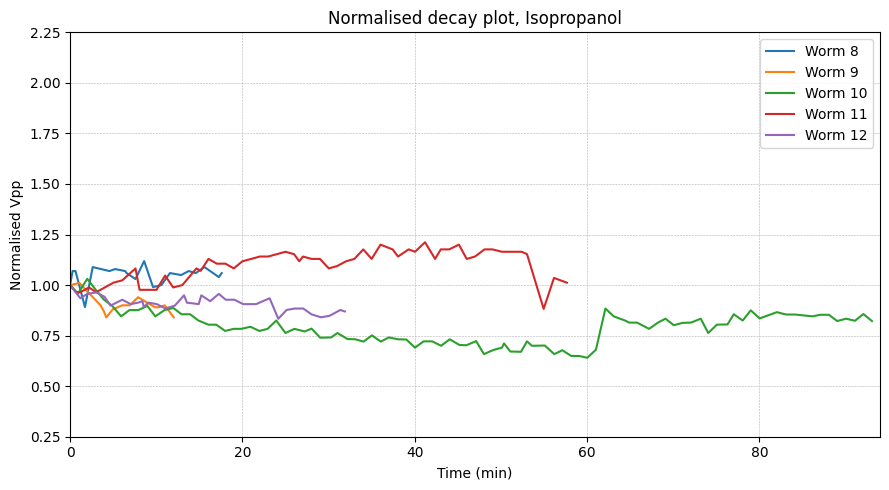

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# ALL EX VIVO
plt.figure(figsize=(9, 5))

# Determine common integer-minute time axis
t_min = int(np.floor(min(data["time_min"].min() for data in all_norm_datasets)))
t_max = int(np.ceil(max(data["time_min"].max() for data in all_norm_datasets)))
all_x = np.arange(t_min, t_max + 1, 1)  # 1-minute steps

for data in all_norm_datasets:
    x = data["time_min"]
    y = data["vpp_norm"]
    
    # Plot individual datasets (no markers)
    plt.plot(
        x,
        y,
        linestyle="-",
        alpha=1,
        label=data["label"]
    )

plt.xlabel("Time (min)")
plt.ylim(0.25, 2.25)
plt.xlim(t_min, t_max)
plt.ylabel("Normalised Vpp")
plt.title("Normalised decay plot, Isopropanol")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()


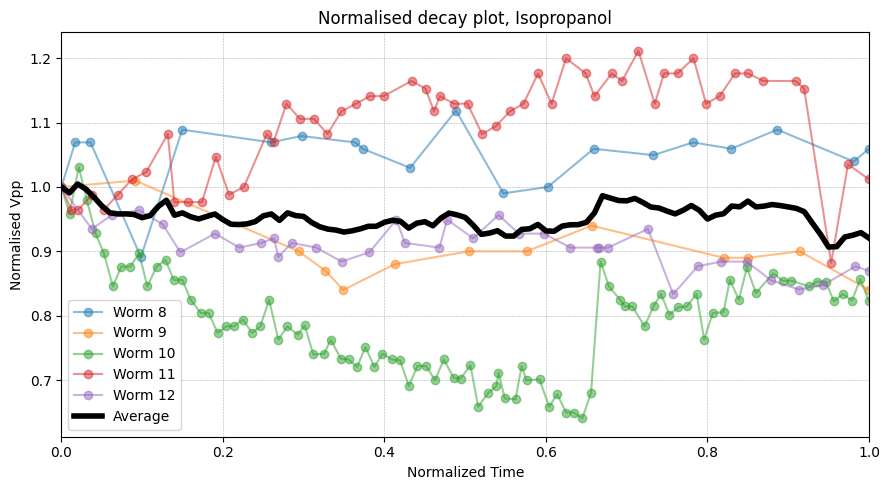

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# ALL EX VIVO
plt.figure(figsize=(9, 5))

all_x = np.arange(0, 1.01, 0.01)  # x-axis points at 0.01 intervals
all_y_interp = []

for data in all_norm_datasets:
    # Normalize x-axis to 0–1
    x_norm = (data["time_min"] - data["time_min"].min()) / (data["time_min"].max() - data["time_min"].min())
    
    # Plot individual datasets
    plt.plot(
        x_norm,
        data["vpp_norm"],
        marker="o",
        linestyle="-",
        alpha=0.5,  # make individual lines semi-transparent
        label=data["label"]
    )
    
    # Interpolate y-values to the common x points
    y_interp = np.interp(all_x, x_norm, data["vpp_norm"])
    all_y_interp.append(y_interp)

# Compute average across datasets
mean_y = np.mean(all_y_interp, axis=0)

# Plot the average signal
plt.plot(
    all_x,
    mean_y,
    marker=None,  # smoother line, optional
    linestyle="-",
    color="black",
    linewidth=4,
    label="Average"
)

plt.xlabel("Normalized Time")
plt.xlim(0,1)
plt.ylabel("Normalised Vpp")
plt.title("Normalised decay plot, Isopropanol")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()


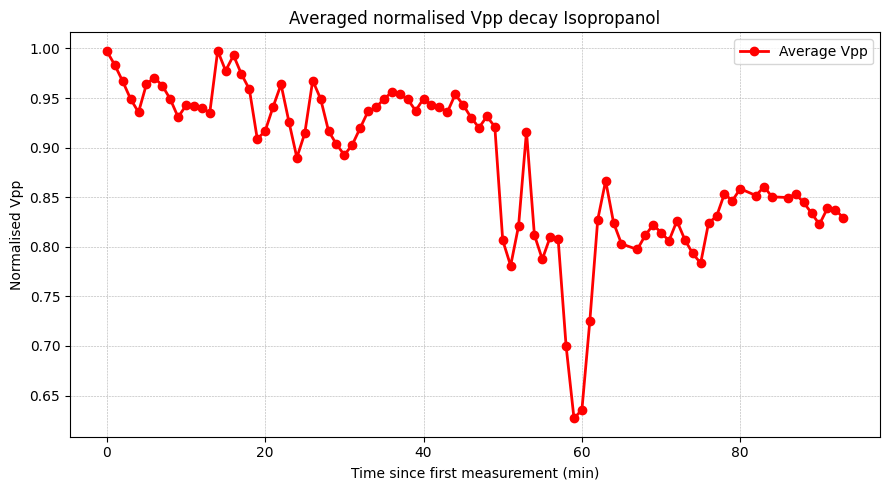

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from collections import defaultdict

# Collect all measurements into bins by minute (integer)
binned_data = defaultdict(list)
for data in all_norm_datasets:
    for t, v in zip(data["time_min"], data["vpp_norm"]):
        minute = int(np.floor(t))  # floor to nearest minute
        binned_data[minute].append(v)

# Sort minutes and compute average per minute
minutes = sorted(binned_data.keys())
average_vpp_per_minute = np.array([np.mean(binned_data[m]) for m in minutes])

# Apply Savitzky-Golay smoothing
window_length = min(len(average_vpp_per_minute) if len(average_vpp_per_minute)%2==1 else len(average_vpp_per_minute)-1, 5)
smoothed_vpp = savgol_filter(average_vpp_per_minute, window_length=window_length, polyorder=2)

# Plot smoothed average per minute
plt.figure(figsize=(9, 5))
plt.plot(minutes, smoothed_vpp, marker="o", linestyle="-", color="red", linewidth=2, label="Average Vpp")
plt.xlabel("Time since first measurement (min)")
plt.ylabel("Normalised Vpp")
plt.title("Averaged normalised Vpp decay Isopropanol")
plt.grid(True, which="both", linestyle="--", linewidth=0.4)
plt.legend()
plt.tight_layout()
plt.show()
